# Data Visualization - Univariate

In [1]:
#Import

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import math

print('¡Librerías importadas con éxito!')

¡Librerías importadas con éxito!


In [2]:
#Abrimos el archivo con los datos de Training Limpios
dfReducido = pd.read_csv('../1 - Base de Datos/clean_data.csv')
dfReducido.head()

,id,name,release_date,artists,total_tracks,t_name0,t_key0,t_mode0,t_dur0,t_dance0,t_energy0,t_speech0,t_acous0,t_ins0,t_live0,t_val0,t_tempo0,t_sig0,popularity,ClasePopularidad
0,0,Ya Solo Eres Mi Ex,2021-09-09,"La Adictiva Banda San José de Mesillas,",7,Ya Solo Eres Mi Ex,7.0,1.0,192284.000,0.537,0.459,0.049,0.490,0.000,0.091,0.779,133.243,3.333,51.0,3
1,1,Nibiru,2019-11-29,"Ozuna,",18,Nibiru,10.0,0.0,195199.667,0.779,0.658,0.202,0.109,0.000,0.114,0.413,139.028,4.000,67.0,4
2,2,DAMN.,2017-04-14,"Kendrick Lamar,",14,BLOOD.,8.0,0.0,154768.333,0.555,0.487,0.273,0.241,0.029,0.287,0.521,122.269,4.000,81.0,5
3,3,Did I Shave My Legs For This?,1996-01-01,"Deana Carter,",11,I've Loved Enough To Know,8.0,1.0,203866.333,0.628,0.585,0.027,0.333,0.000,0.203,0.556,114.783,4.000,53.0,3
4,4,glisten,2018-05-04,"Jeremy Zucker,",4,all the kids are depressed,9.0,1.0,140693.000,0.638,0.302,0.072,0.711,0.000,0.271,0.533,116.460,4.000,70.0,4


In [3]:
dfReducido.shape

(72357, 20)

In [4]:
#Para las visualizaciones, cambiamos los valores numericos de Key y Mode a sus categorias respectivas


dfReducido['t_key0'].replace([0,1,2,3,4,5,6,7,8,9,10,11],['C','C♯','D','E♭','E','F','F♯','G','G♯','A','B♭','B'],inplace=True)
dfReducido['t_mode0'].replace([0,1],['menor','mayor'],inplace=True)

C:\Users\fghiotti\AppData\Local\Temp\ipykernel_42888\3862133641.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  dfReducido['t_key0'].replace([0,1,2,3,4,5,6,7,8,9,10,11],['C','C♯','D','E♭','E','F','F♯','G','G♯','A','B♭','B'],inplace=True)
C:\Users\fghiotti\AppData\Local\Temp\ipykernel_42888\3862133641.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the in

### 1) Analisis Univariado

De todas las variables, nos quedamos para hacer el analisis univariado con:

1. Categoricas
    - aritist
    - key
    - Mode
2. Numericas
    - t_dance0 (dancebility)
    - t_energy0 (Energy)
    - t_speech0 (Speechiness)
    - Popularuty
3. Temporales
    - Release_date

In [5]:
dfUnivariado = dfReducido[['artists','release_date','t_key0','t_mode0','t_dance0','t_energy0','t_speech0','popularity']]
dfUnivariado.head()

,artists,release_date,t_key0,t_mode0,t_dance0,t_energy0,t_speech0,popularity
0,"La Adictiva Banda San José de Mesillas,",2021-09-09,G,mayor,0.537,0.459,0.049,51.0
1,"Ozuna,",2019-11-29,B♭,menor,0.779,0.658,0.202,67.0
2,"Kendrick Lamar,",2017-04-14,G♯,menor,0.555,0.487,0.273,81.0
3,"Deana Carter,",1996-01-01,G♯,mayor,0.628,0.585,0.027,53.0
4,"Jeremy Zucker,",2018-05-04,A,mayor,0.638,0.302,0.072,70.0


In [6]:
from pandas.api.types import is_numeric_dtype

def infoVar(df):
    '''Funcion que toma un DataFrame y devuelve una tabla con informacion descriptiva de variables categoricas ynumericas'''
    
    #Primer tabla -> cantidad de variables mas info sobre categoricas (numericas se llena como '-')
    infoCat = df.describe(include = 'all').T[['count','unique','top','freq',]] 
    
    #Segunda Tabla -> info de numeicas: promedio, st deviation, percentiles, min/max
    infoNum = df.describe(include = 'all').T[['mean','std','min','max','25%','50%','75%']]
    
    #Tercer tabla -> Tipo de dato, categoria de dato y datos faltantes.
    infoExtra = pd.DataFrame(columns = ['Tipo' , 'Vacios', ' Es Numerica'])
    
    #Para llenar la tercer tabla, hacemos un loop
    
    for col in df:
        dataSerie = df[col]
        #Lleno la fila de mi tabla infoExtra con las datos de la columna correspondiente en el dataframe df
        infoExtra.loc[col] = [dataSerie.dtype, dataSerie.isnull().sum(),is_numeric_dtype(dataSerie)]
    
   #Unimos las tablas

    tabla = pd.concat([infoCat,pd.concat([infoExtra,infoNum],axis=1)],axis=1).fillna('-')
    return tabla

In [7]:
tablaUnivariado = infoVar(dfUnivariado)
tablaUnivariado

C:\Users\fghiotti\AppData\Local\Temp\ipykernel_42888\1135932386.py:24: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  tabla = pd.concat([infoCat,pd.concat([infoExtra,infoNum],axis=1)],axis=1).fillna('-')


,count,unique,top,freq,Tipo,Vacios,Es Numerica,mean,std,min,max,25%,50%,75%
artists,72357.0,46374,"Various Artists,",1662,object,0,False,-,-,-,-,-,-,-
release_date,72357.0,7574,2021-09-03,622,object,0,False,-,-,-,-,-,-,-
t_key0,72277.0,12,C♯,8891,object,80,False,-,-,-,-,-,-,-
t_mode0,72277.0,2,mayor,42616,object,80,False,-,-,-,-,-,-,-
t_dance0,72227.0,-,-,-,float64,130,True,0.620129,0.167232,0.0,0.985,0.52,0.642,0.742
t_energy0,72227.0,-,-,-,float64,130,True,0.59905,0.222371,0.0,1.0,0.465,0.624,0.765
t_speech0,72227.0,-,-,-,float64,130,True,0.130911,0.130323,0.0,0.965,0.044,0.0724,0.177
popularity,72357.0,-,-,-,float64,0,True,30.998632,18.379102,1.0,100.0,16.0,30.0,45.0


#### Analisis Variables Categoricas

#### 1) Artists

In [8]:
!pip install sidetable

     ---------------------------------------- 0.0/45.4 kB ? eta -:--:--
     ----------------- -------------------- 20.5/45.4 kB 330.3 kB/s eta 0:00:01
     -------------------------------------- 45.4/45.4 kB 374.5 kB/s eta 0:00:00



[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [9]:
import sidetable
frecArtistas = dfUnivariado.stb.freq(['artists'])
frecArtistas

,artists,count,percent,cumulative_count,cumulative_percent
0,"Various Artists,",1662,2.296944,1662,2.296944
1,"A.R. Rahman,",52,0.071866,1714,2.368810
2,"Pritam,",32,0.044225,1746,2.413035
3,"BTS,",28,0.038697,1774,2.451732
4,"$uicideboy$,",28,0.038697,1802,2.490429
...,...,...,...,...,...
46369,"""O"",",1,0.001382,72353,99.994472
46370,"""Ipi Ntombi"" 1975 Original Cast, Bertha Egnos,...",1,0.001382,72354,99.995854
46371,"""Elena Of Avalor"" Cast,",1,0.001382,72355,99.997236
46372,"!nvite,",1,0.001382,72356,99.998618


***Observacion***

La cantidad de Artistas que se repiten no es mucha. Veamos cuales son aquellos con mas apariciones

In [10]:
#Top 15 de artistas con mas apariciones

frecArtistas.head(15)

,artists,count,percent,cumulative_count,cumulative_percent
0,"Various Artists,",1662,2.296944,1662,2.296944
1,"A.R. Rahman,",52,0.071866,1714,2.368810
2,"Pritam,",32,0.044225,1746,2.413035
3,"BTS,",28,0.038697,1774,2.451732
4,"$uicideboy$,",28,0.038697,1802,2.490429
5,"Vitamin String Quartet,",25,0.034551,1827,2.524980
6,"Scarlxrd,",24,0.033169,1851,2.558149
7,"YoungBoy Never Broke Again,",23,0.031787,1874,2.589936
8,"Taylor Swift,",23,0.031787,1897,2.621723
9,"Grateful Dead,",23,0.031787,1920,2.653510


In [11]:
#Artistas que forman el top5 y su peso comparado al resto
top5 = dfUnivariado.stb.freq(['artists'],thresh=2.5)
top5

,artists,count,percent,cumulative_count,cumulative_percent
0,"Various Artists,",1662,2.296944,1662,2.296944
1,"A.R. Rahman,",52,0.071866,1714,2.368810
2,"Pritam,",32,0.044225,1746,2.413035
3,"BTS,",28,0.038697,1774,2.451732
4,"$uicideboy$,",28,0.038697,1802,2.490429
5,others,70555,97.509571,72357,100.000000


In [12]:
artista = frecArtistas['artists'][0]

contador = frecArtistas['count'][0]
porcentaje = round(frecArtistas['percent'][0],1)

print(f'El artista mas repetido es {artista} con {contador} apariciones, pero solo representa el {porcentaje}% del total de los datos')

El artista mas repetido es Various Artists,  con 1662 apariciones, pero solo representa el 2.3% del total de los datos


Text(0.5, 1.0, 'Comparacion de apariciones del Top15 Artistas mas repetidos')

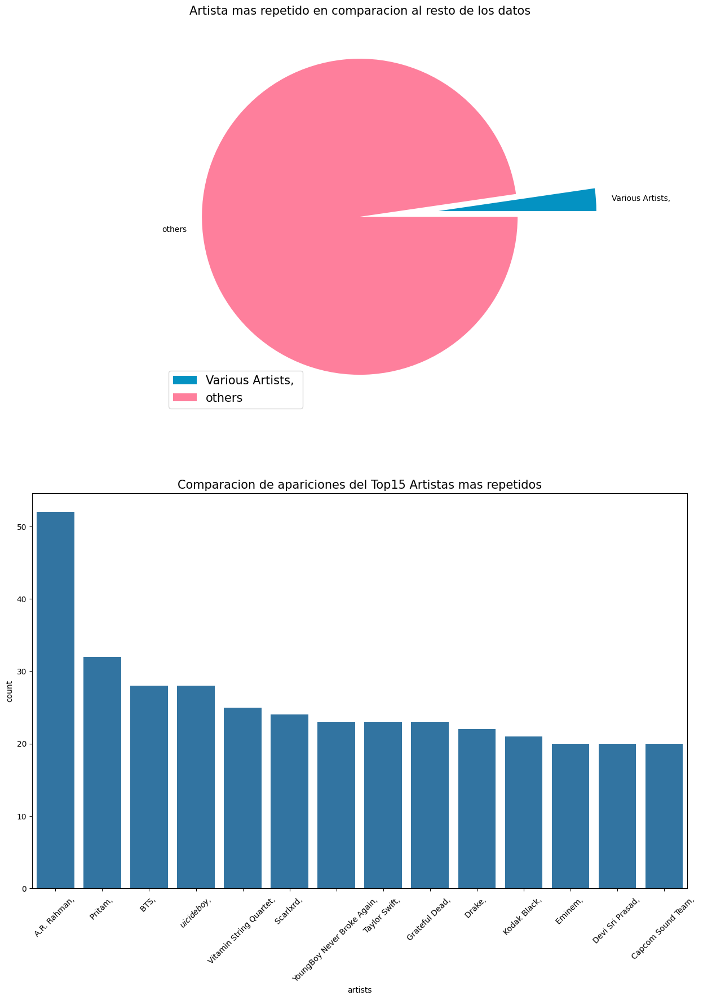

In [13]:
#Analisis Variable Artists en Graficas

fig, axes = plt.subplots(2,1, figsize=(15,20)) 

axes[0].pie([top5['count'][0],top5['count'][5]], labels = [top5['artists'][0],top5['artists'][5]],explode = (0.5,0),colors = ['#0492c2','#fe7f9c'])
axes[0].legend(loc = 'lower left', fontsize=15)
axes[0].set_title('Artista mas repetido en comparacion al resto de los datos',fontsize=15)


sns.barplot(x = 'artists',y = 'count',data = frecArtistas.head(15).drop([0]),ax=axes[1]) #No incluyo "Various Artists"

axes[1].tick_params(axis='x', rotation=45, labelsize = 10)
axes[1].set_title('Comparacion de apariciones del Top15 Artistas mas repetidos',fontsize=15)

**Observaciones**:

- Vemos que el artista que mas se repite es "Various Artists", pero aun asi representa solamente 2.3% de los datos. Por lo tanto podemos decir que hay mucha variedad en los artistas presentes en el dataset
- Viendo la comparativa entre el Top15 de artistas con mayor aparicion, se destaca "A.R. Rahman" con 52 registros, y luego todos muy cercanos con entre 30 y 20 registros.

#### 2) Key y Mode

C:\Users\fghiotti\AppData\Local\Temp\ipykernel_42888\968842469.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='t_mode0',data=dfUnivariado,ax = axes[1],palette=['#432371',"#C8A2C8"])


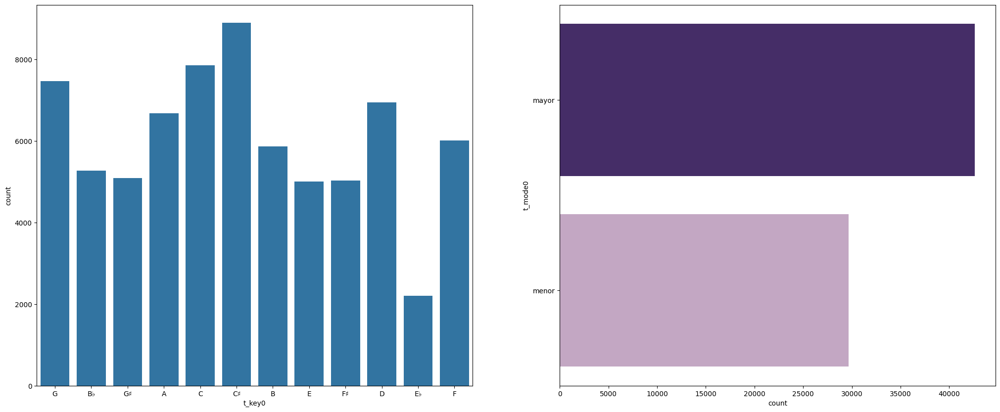

In [14]:
fig, axes = plt.subplots(1,2, figsize=(25,10)) 

sns.countplot(x='t_key0',data=dfUnivariado,ax = axes[0])
sns.countplot(y='t_mode0',data=dfUnivariado,ax = axes[1],palette=['#432371',"#C8A2C8"])
plt.show()

**Observaciones**

El top tres de tonalidades es de C# - C - G. 
Se ve un mayor numero de canciones en tono Mayor, lo cual puede estar ligado a que las canciones en tono mayor suelen sugerir sonidos "felices" (mientras que el tono menor da melodias mas "tristes")

#### Analisis Variables Numericas

#### 1) Variables Descriptivas 

In [15]:
#Tabla de frecuencia de las variables numericas
'''Las variables numericas bajo analisis toman valores del 0 al 1. Por lo tanto vamos a dividir 
los datos en 10 intervalos para relaizar las frecuencias. De esta forma las 3 variables tendran los mismos intervalos'''


intervalos = pd.interval_range(
      start=0,
      end=1,
      periods = 10,
      closed="left")

#Redondeo los valores en cada intervalo
inter = pd.IntervalIndex([
    pd.Interval( round(i.left,1), round(i.right,1), i.closed )
    for i in intervalos])


'''Tabla con las freuencias de cada variable numerica en los itervalos definidos'''
frecuenciasNum = pd.DataFrame(index = inter)

frecuenciasNum['Dance'] = pd.cut(dfUnivariado['t_dance0'], bins = inter).value_counts()
frecuenciasNum['Energy'] = pd.cut(dfUnivariado['t_energy0'], bins = inter).value_counts()
frecuenciasNum['Speech'] = pd.cut(dfUnivariado['t_speech0'], bins = inter).value_counts()

In [16]:
frecuenciasNum

,Dance,Energy,Speech
"[0.0, 0.1)",180,2272,43676
"[0.1, 0.2)",1210,2314,12476
"[0.2, 0.3)",2082,3204,7714
"[0.3, 0.4)",4126,5155,5070
"[0.4, 0.5)",8265,8394,2057
"[0.5, 0.6)",13252,11625,603
"[0.6, 0.7)",17351,13066,200
"[0.7, 0.8)",16387,11953,97
"[0.8, 0.9)",7975,9129,114
"[0.9, 1.0)",1399,5114,220


***Observacion***: Vemos que la variable Speech esta muy sesgada a valores bajos, mietras que las otras dos parecen distribuirse mas en el centro (teniendo la mayor frecuencia en valores centrales)

In [17]:
'''Tablas de frecuencia completas para cada variable '''

#Tabla para Dancebility
frecuenciasDance = pd.DataFrame(index = inter)

frecuenciasDance['Dance'] = pd.cut(dfUnivariado['t_dance0'], bins = inter).value_counts()
frecuenciasDance['FrecRelativa'] = frecuenciasDance['Dance']/frecuenciasDance['Dance'].sum()
frecuenciasDance[['FrecAbsoluta_Acumulada','FrecRelativa_Acumulada']] = frecuenciasDance[['Dance','FrecRelativa']].cumsum()

#Tabla para Energy
frecuenciasEnergy = pd.DataFrame(index = inter)

frecuenciasEnergy['Energy'] = pd.cut(dfUnivariado['t_energy0'], bins = inter).value_counts()
frecuenciasEnergy['FrecRelativa'] = frecuenciasEnergy['Energy']/frecuenciasEnergy['Energy'].sum()
frecuenciasEnergy[['FrecAbsoluta_Acumulada','FrecRelativa_Acumulada']] = frecuenciasEnergy[['Energy','FrecRelativa']].cumsum()

#Tabla para Speech
frecuenciasSpeech = pd.DataFrame(index = inter)

frecuenciasSpeech['Speech'] = pd.cut(dfUnivariado['t_dance0'], bins = inter).value_counts()
frecuenciasSpeech['FrecRelativa'] = frecuenciasSpeech['Speech']/frecuenciasSpeech['Speech'].sum()
frecuenciasSpeech[['FrecAbsoluta_Acumulada','FrecRelativa_Acumulada']] = frecuenciasSpeech[['Speech','FrecRelativa']].cumsum()




In [18]:
frecuenciasDance

,Dance,FrecRelativa,FrecAbsoluta_Acumulada,FrecRelativa_Acumulada
"[0.0, 0.1)",180,0.002492,180,0.002492
"[0.1, 0.2)",1210,0.016753,1390,0.019245
"[0.2, 0.3)",2082,0.028826,3472,0.048071
"[0.3, 0.4)",4126,0.057125,7598,0.105196
"[0.4, 0.5)",8265,0.114431,15863,0.219627
"[0.5, 0.6)",13252,0.183477,29115,0.403104
"[0.6, 0.7)",17351,0.240229,46466,0.643333
"[0.7, 0.8)",16387,0.226882,62853,0.870215
"[0.8, 0.9)",7975,0.110416,70828,0.980631
"[0.9, 1.0)",1399,0.019369,72227,1.000000


c:\Users\fghiotti\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\_base.py:1608: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
c:\Users\fghiotti\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\_base.py:1608: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
c:\Users\fghiotti\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\_base.py:1608: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


Text(0.5, 1.0, 'BoxPlot Speech')

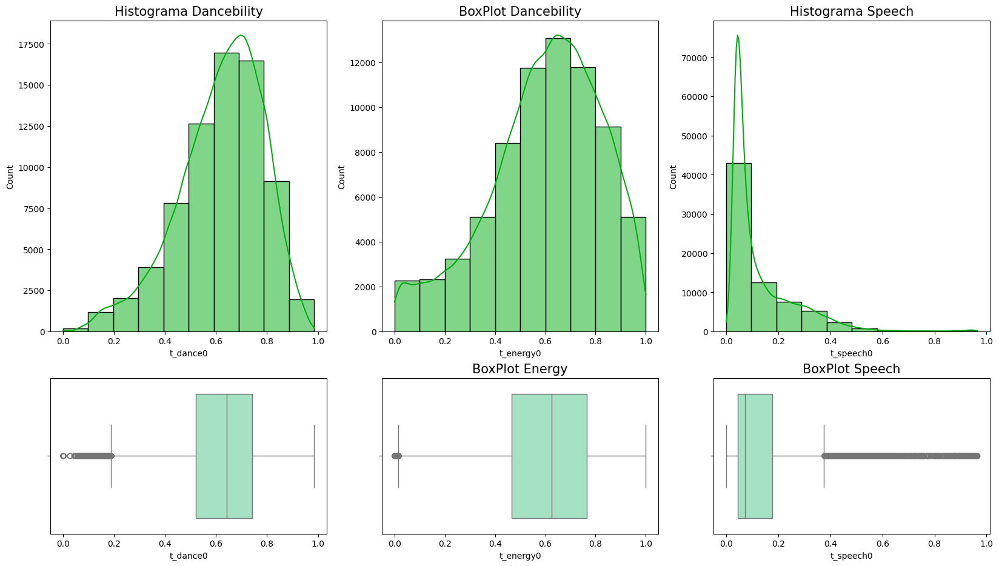

In [19]:
#Analisis Variables Numericas en Graficas

fig, axes = plt.subplots(2,3, figsize=(20,11), gridspec_kw={'height_ratios': [2, 1]}) 
'''Creamos una figura que genera 6 axes, donde hay una relacion 3 a 1 en el ancho de cada par de graficos 
Nota: se podria hacer algo similar a lo largo usando gridspec_kw={'height_ratios':[3,1]'''

sns.histplot(x = 't_dance0',data = dfUnivariado, color ='#03ac13', bins = 10, ax = axes[0,0], kde = True)
sns.boxplot(x = 't_dance0', data = dfUnivariado, orient = 'v', color = '#99edc3', ax = axes[1,0])

sns.histplot(x = 't_energy0',data = dfUnivariado, color ='#03ac13', bins = 10, ax = axes[0,1], kde = True)
sns.boxplot(x = 't_energy0', data = dfUnivariado, orient = 'v', color = '#99edc3', ax = axes[1,1])

sns.histplot(x = 't_speech0',data = dfUnivariado, color ='#03ac13', bins = 10, ax = axes[0,2], kde = True)
sns.boxplot(x = 't_speech0', data = dfUnivariado, orient = 'v', color = '#99edc3', ax = axes[1,2])

axes[0,0].set_title('Histograma Dancebility',fontsize=15)
axes[0,1].set_title('Histograma Energy',fontsize=15)
axes[0,2].set_title('Histograma Speech',fontsize=15)

axes[0,1].set_title('BoxPlot Dancebility',fontsize=15)
axes[1,1].set_title('BoxPlot Energy',fontsize=15)
axes[1,2].set_title('BoxPlot Speech',fontsize=15)

**Observaciones**

Como se comento previamente, la variable Speechness esta muy sesgada a valores cercanos a cero lo cual significa que la gran mayoria de las canciones NO poseen palabras habladas.
La variable Danceability posee una cola hacia los valores bajos, por lo que no hay muchos registros con baja bailabilidad

#### 2) Variable Target - Popularity

In [20]:
#Tabla de frecuencia del target
'''La Variable Popularity toma valores del 0 al 100, vamos a dividirlo en 10 intervalos'''


intervalosPop = pd.interval_range(
      start=0,
      end=100,
      periods = 10,
      closed="left")

#Redondeo los valores en cada intervalo
interPop = pd.IntervalIndex([
    pd.Interval( round(i.left,1), round(i.right,1), i.closed )
    for i in intervalosPop])

#Tabla de frecuencia para Popularity

frecuenciasPopularity = pd.DataFrame(index = interPop)

frecuenciasPopularity['Popularity'] = pd.cut(dfUnivariado['popularity'], bins = interPop).value_counts()
frecuenciasPopularity['FrecRelativa'] = frecuenciasPopularity['Popularity']/frecuenciasPopularity['Popularity'].sum()
frecuenciasPopularity[['FrecAbsoluta_Acumulada','FrecRelativa_Acumulada']] = frecuenciasPopularity[['Popularity','FrecRelativa']].cumsum()

In [21]:
frecuenciasPopularity

,Popularity,FrecRelativa,FrecAbsoluta_Acumulada,FrecRelativa_Acumulada
"[0, 10)",10818,0.149511,10818,0.149511
"[10, 20)",11498,0.158909,22316,0.308419
"[20, 30)",13312,0.183979,35628,0.492399
"[30, 40)",12711,0.175673,48339,0.668072
"[40, 50)",10868,0.150202,59207,0.818274
"[50, 60)",7916,0.109404,67123,0.927677
"[60, 70)",4020,0.055559,71143,0.983236
"[70, 80)",1080,0.014926,72223,0.998162
"[80, 90)",127,0.001755,72350,0.999917
"[90, 100)",6,0.000083,72356,1.000000


<Axes: xlabel='popularity'>

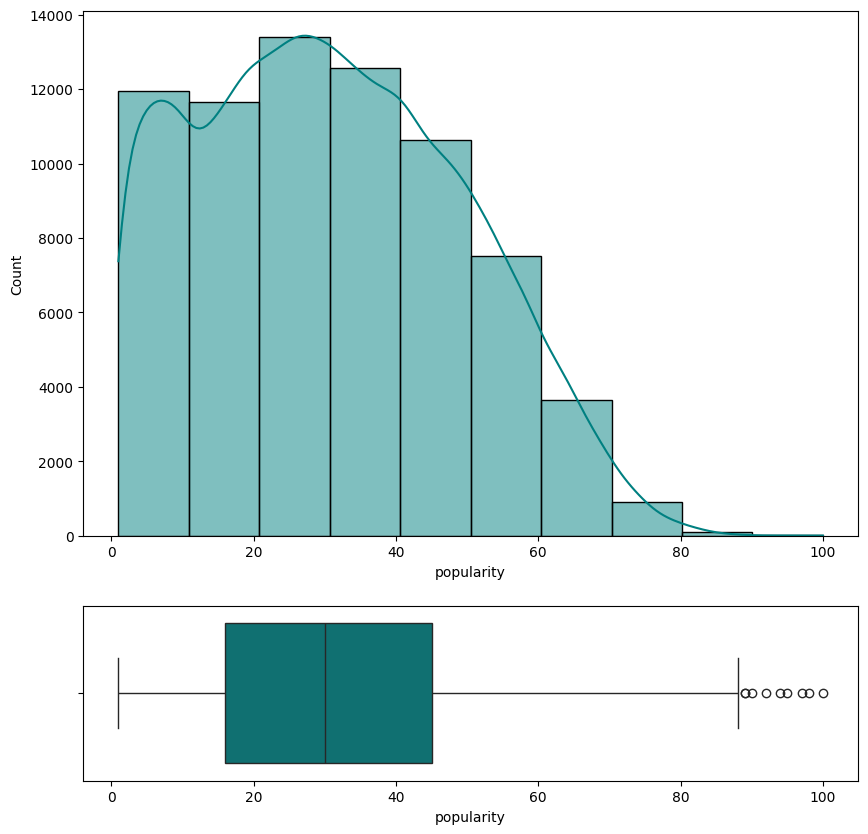

In [22]:
#Evaluacion grafica de la variable Target

fig, axes = plt.subplots(2,1, figsize=(10,10), gridspec_kw={'height_ratios': [3, 1]}) 

sns.histplot(x = 'popularity',data = dfUnivariado, color ='#008081', bins = 10, ax = axes[0], kde = True)
sns.boxplot(x = 'popularity', data = dfUnivariado, orient = 'h', color = '#008081', ax = axes[1])

**Observaciones**

Vemos que los datos estan acumulados al inicio, en valores bajos de popularidad

In [23]:
##Por curiosidad, localizamos los 6 valores con popularidad mayor o igual a 90

dfReducido.loc[dfReducido['popularity']>=90][['name','release_date','artists','total_tracks','popularity']].sort_values('popularity')

,name,release_date,artists,total_tracks,popularity
3384,STAY (with Justin Bieber),2021-07-09,"The Kid LAROI, Justin Bieber,",1,90.0
1594,Happier Than Ever,2021-07-30,"Billie Eilish,",16,92.0
1326,Planet Her,2021-06-25,"Doja Cat,",14,94.0
38702,Planet Her,2021-06-25,"Doja Cat,",14,95.0
31,SOUR,2021-05-21,"Olivia Rodrigo,",11,97.0
973,Donda,2021-08-29,"Kanye West,",27,98.0
627,Certified Lover Boy,2021-09-03,"Drake,",21,100.0


***NOTA***:

Viendo el resultado de la tabla anterior, vemos que un registro esta repetido: Doja Cat - Planet Her.
Si bien anteriormente se hizo un filtrado para eliminar duplicados, esta duplicidad no se filtro porque cada registro tiene diferentes valores de popularidad (94 y 95).

#### Analisis Variable Temporal

In [24]:
#Frecuencia de Release Date

frecRelease = dfUnivariado.stb.freq(['release_date'])
frecRelease

,release_date,count,percent,cumulative_count,cumulative_percent
0,2021-09-03,622,0.859627,622,0.859627
1,2021-09-10,608,0.840278,1230,1.699905
2,2021-07-30,469,0.648175,1699,2.348080
3,2021-08-27,454,0.627444,2153,2.975524
4,2021-08-20,437,0.603950,2590,3.579474
...,...,...,...,...,...
7569,1933,1,0.001382,72353,99.994472
7570,1930,1,0.001382,72354,99.995854
7571,1927,1,0.001382,72355,99.997236
7572,1917-06-05,1,0.001382,72356,99.998618


In [25]:
frecRelease.loc[2000]

release_date          2016-04-04
count                          6
percent                 0.008292
cumulative_count           61001
cumulative_percent     84.305596
Name: 2000, dtype: object

In [26]:
dfReducido.loc[dfReducido['release_date']=='0000']

,id,name,release_date,artists,total_tracks,t_name0,t_key0,t_mode0,t_dur0,t_dance0,t_energy0,t_speech0,t_acous0,t_ins0,t_live0,t_val0,t_tempo0,t_sig0,popularity,ClasePopularidad
8119,10908,Xem Nhau Là Dĩ Vãng,0000,"Le Bao Binh,",1,Xem Nhau Là Dĩ Vãng,C,menor,278264.000,0.644,0.462,0.0292,0.763,0.000055,0.0946,0.444,116.000,4.000,5.0,1
29981,54692,Cũng Đành Thôi,0000,"Đức Phúc,",1,Cũng Đành Thôi,G,mayor,272944.000,0.494,0.491,0.0268,0.546,0.000000,0.1050,0.308,143.915,4.000,35.0,2
39684,77062,Những Bản Hits Do Khắc Việt Trình Bày (original),0000,"Khac Viet,",59,Bình Yên Nhé,G,menor,280635.000,0.502,0.386,0.0300,0.805,0.000000,0.0960,0.245,109.693,4.000,36.0,2
45996,92206,Những Bài Hát Hay Nhất Của Hồ Quang Hiếu,0000,"Hồ Quang Hiếu,",94,Anh Sẽ Ra Đi,E,menor,285114.000,0.615,0.608,0.0590,0.448,0.000000,0.1490,0.569,119.996,3.667,29.0,2
53003,109447,Những Bài Hát Hay Nhất Của Trung Quân Idol (or...,0000,"Trung Quân,",45,Anh Chỉ Quan Tâm Em (Đặng Lê Quân Cover),C,mayor,257381.667,0.519,0.266,0.0370,0.867,0.000000,0.1480,0.254,131.147,4.000,36.0,2


**NOTA**: 
- Los datos de fechas No estan en formato de fecha. Por lo que se hace una funcion para cambiarlos de formato
- Hay datos con release_date = 0000, lo cual no es una fecha correcta

In [27]:
#Hacemos un loop para poder pasar los datos de Release_date a formato fecha

from datetime import datetime

for i in range(0, frecRelease.shape[0]):
   
    fecha = frecRelease['release_date'][i]
    
    
    #Evauamos que formato tiene el dato en el DataSet (tengo Y-M-D , Y-M y Y)
    if len(fecha) == 10:
        datetime_object = datetime.strptime(frecRelease['release_date'][i], '%Y-%m-%d')
        frecRelease['release_date'][i] = datetime_object
   
    elif len(fecha) == 7:
        datetime_object = datetime.strptime(frecRelease['release_date'][i], '%Y-%m')
        frecRelease['release_date'][i] = datetime_object
    
    else:
        if fecha == '0000':
            frecRelease.drop([i], inplace=True)   #Aquellos datos que presentan una fecha= '0000' son eliminados
        else:    
            datetime_object = datetime.strptime(frecRelease['release_date'][i], '%Y')
            frecRelease['release_date'][i] = datetime_object 



C:\Users\fghiotti\AppData\Local\Temp\ipykernel_42888\3309275932.py:13: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  frecRelease['release_date'][i] = datetime_object
C:\Users\fghiotti\AppData\Local\Temp\ipykernel_42888\3309275932.py:13: Sett

In [28]:
frecRelease

,release_date,count,percent,cumulative_count,cumulative_percent
0,2021-09-03 00:00:00,622,0.859627,622,0.859627
1,2021-09-10 00:00:00,608,0.840278,1230,1.699905
2,2021-07-30 00:00:00,469,0.648175,1699,2.348080
3,2021-08-27 00:00:00,454,0.627444,2153,2.975524
4,2021-08-20 00:00:00,437,0.603950,2590,3.579474
...,...,...,...,...,...
7569,1933-01-01 00:00:00,1,0.001382,72353,99.994472
7570,1930-01-01 00:00:00,1,0.001382,72354,99.995854
7571,1927-01-01 00:00:00,1,0.001382,72355,99.997236
7572,1917-06-05 00:00:00,1,0.001382,72356,99.998618


In [29]:
frecReleaseOrder = frecRelease.sort_values(by= ['release_date'])
frecReleaseOrder

,release_date,count,percent,cumulative_count,cumulative_percent
7573,1900-01-01 00:00:00,1,0.001382,72357,100.000000
7572,1917-06-05 00:00:00,1,0.001382,72356,99.998618
7571,1927-01-01 00:00:00,1,0.001382,72355,99.997236
7570,1930-01-01 00:00:00,1,0.001382,72354,99.995854
7569,1933-01-01 00:00:00,1,0.001382,72353,99.994472
...,...,...,...,...,...
369,2021-09-12 00:00:00,42,0.058046,35857,49.555675
172,2021-09-13 00:00:00,74,0.102271,24698,34.133532
139,2021-09-14 00:00:00,83,0.114709,22115,30.563733
84,2021-09-15 00:00:00,107,0.147878,16960,23.439336


C:\Users\fghiotti\AppData\Local\Temp\ipykernel_42888\1692512687.py:6: MatplotlibDeprecationWarning: The plot_date function was deprecated in Matplotlib 3.9 and will be removed in 3.11. Use plot instead.
  plt.plot_date(frecReleaseOrder['release_date'],frecReleaseOrder['count'], linestyle = 'solid',color = '#a50b5e')


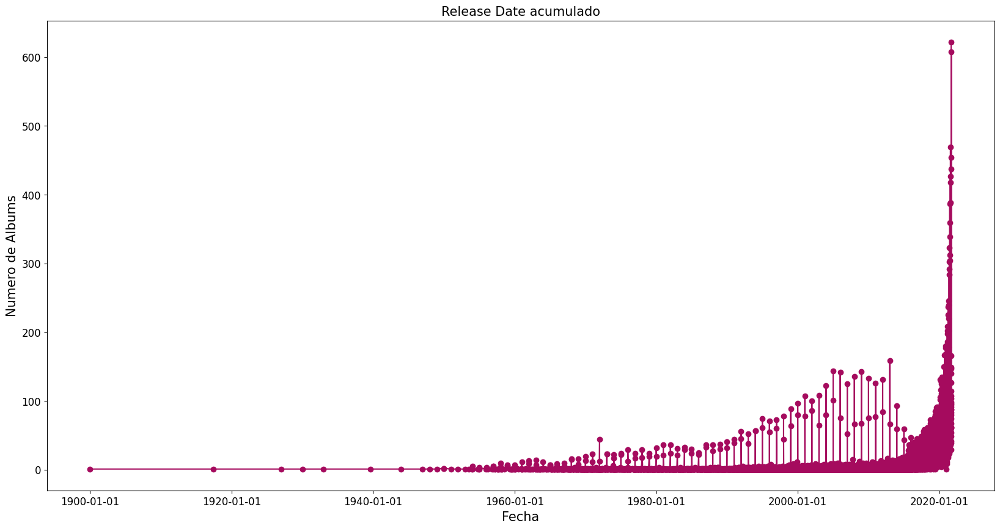

In [30]:
#Analisis Variable Temporal en Graficas
from matplotlib import dates as mpl_dates

fig, ax = plt.subplots(figsize=(20,10))

plt.plot_date(frecReleaseOrder['release_date'],frecReleaseOrder['count'], linestyle = 'solid',color = '#a50b5e')

date_format = mpl_dates.DateFormatter('%Y-%m-%d')
plt.gca().xaxis.set_major_formatter(date_format)

plt.title('Release Date acumulado',fontsize=15)
plt.xlabel('Fecha',fontsize=15)
plt.ylabel('Numero de Albums',fontsize=15)

plt.tick_params(axis='x', labelsize = 12)
plt.tick_params(axis='y', labelsize = 12)

C:\Users\fghiotti\AppData\Local\Temp\ipykernel_42888\148044293.py:8: MatplotlibDeprecationWarning:

The plot_date function was deprecated in Matplotlib 3.9 and will be removed in 3.11. Use plot instead.



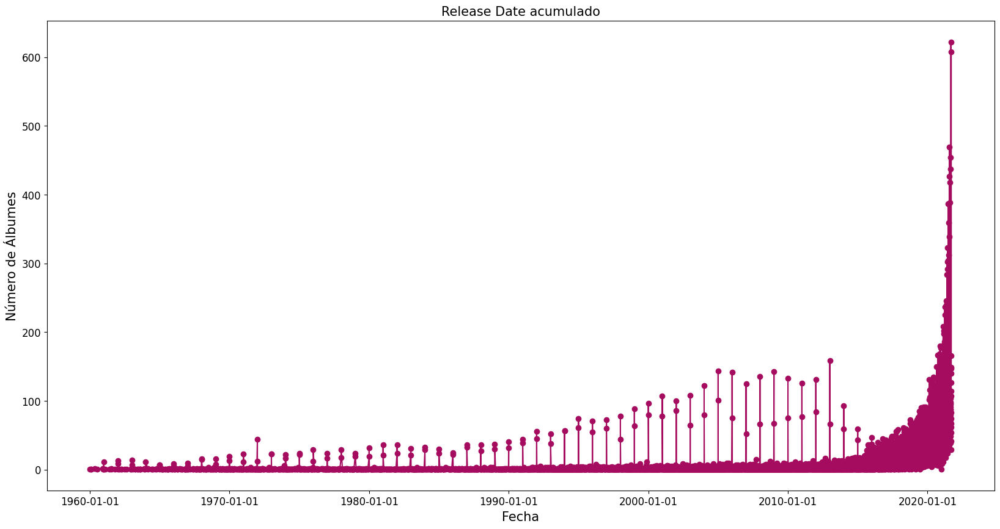

In [55]:

frecReleaseOrder['release_date'] = pd.to_datetime(frecReleaseOrder['release_date'])

# Filtrar datos para fechas posteriores a 1960
frecReleaseOrder_filtered = frecReleaseOrder[frecReleaseOrder['release_date'] > pd.to_datetime('1960-01-01')]

fig, ax = plt.subplots(figsize=(20, 10))

plt.plot_date(frecReleaseOrder_filtered['release_date'], frecReleaseOrder_filtered['count'], linestyle='solid', color='#a50b5e')

date_format = mpl_dates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_format)

plt.title('Release Date acumulado', fontsize=15)
plt.xlabel('Fecha', fontsize=15)
plt.ylabel('Número de Álbumes', fontsize=15)

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

plt.show()


***Observaciones***

- La mayoria de los registros tienen Release_date entre el 2020 y el 2021
- Se podria acotar el analisis, eliminado registros anteriores a 1960.